# Results Summary

All analyses were ran on 4fold degenerate sites :
 * population structure analyses (PCA, Admixture) were run on 4fold degenerate sites filtered for MAF>0.05 and LD sites (Prunes SNPs within 20 Kb using r-squared cutoff of 0.2).
 * diverstity analyses were computed with Angsd realSFS function (option fst, saf2theta, do_saf)
 * demographic analyses (EPOS, dadi) used SFS generated from ANGSD



## Population structure

### PCA

PCA ran with PCAngsd (only centroids of each city*habitat displayed)

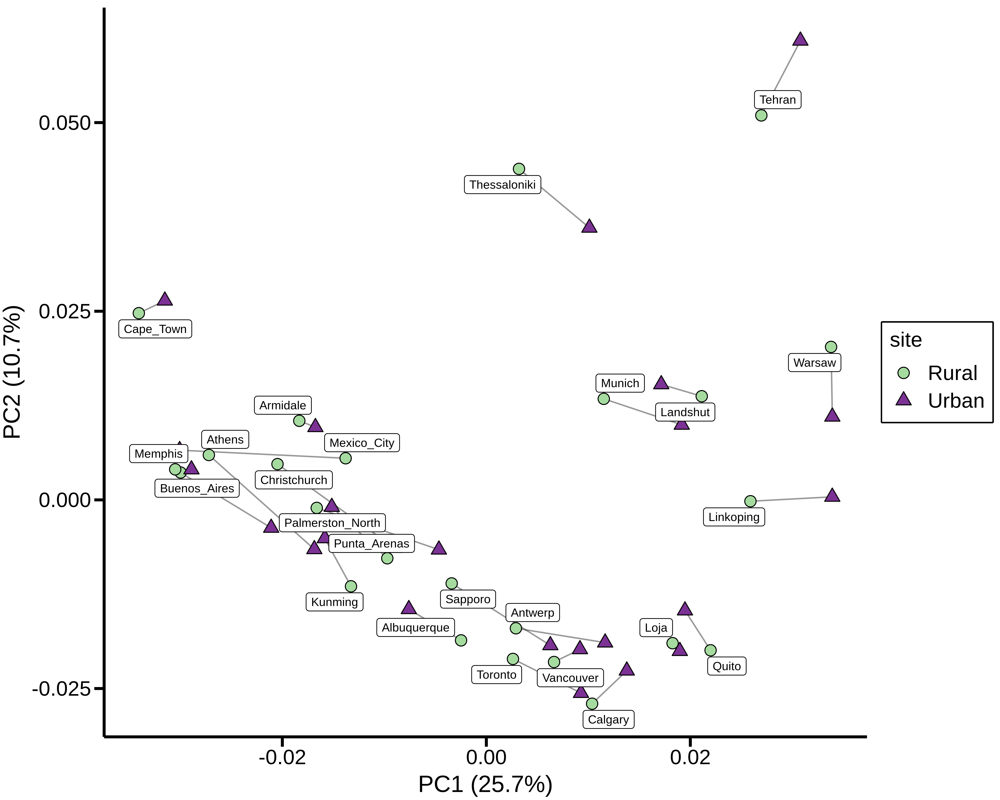

In [7]:
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Centroid_PCA.png")

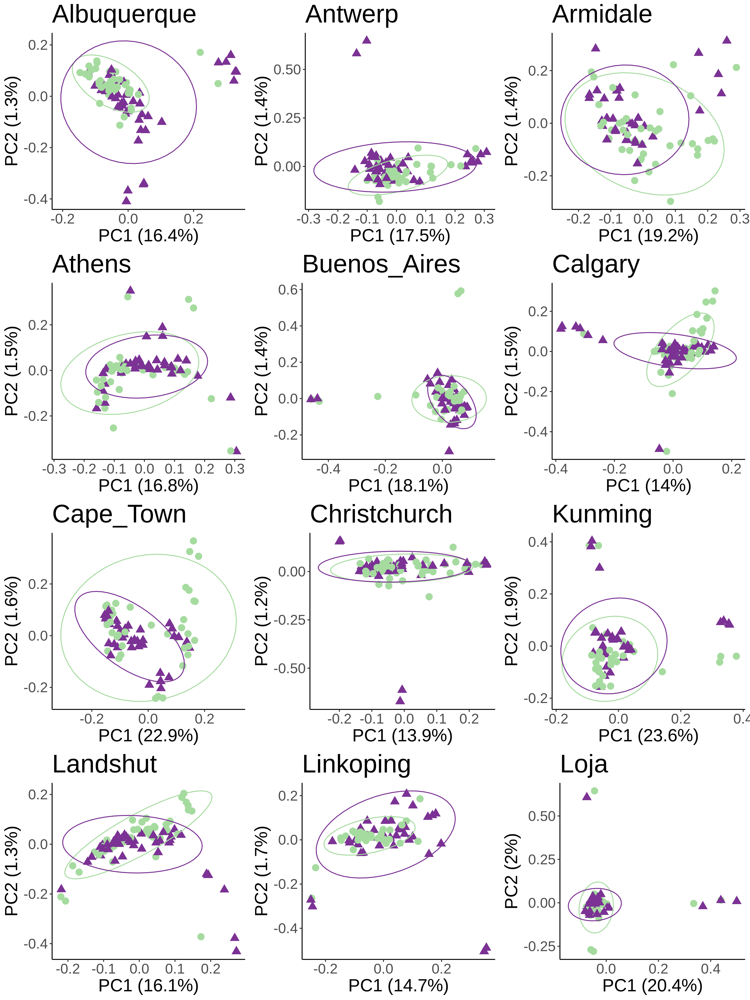

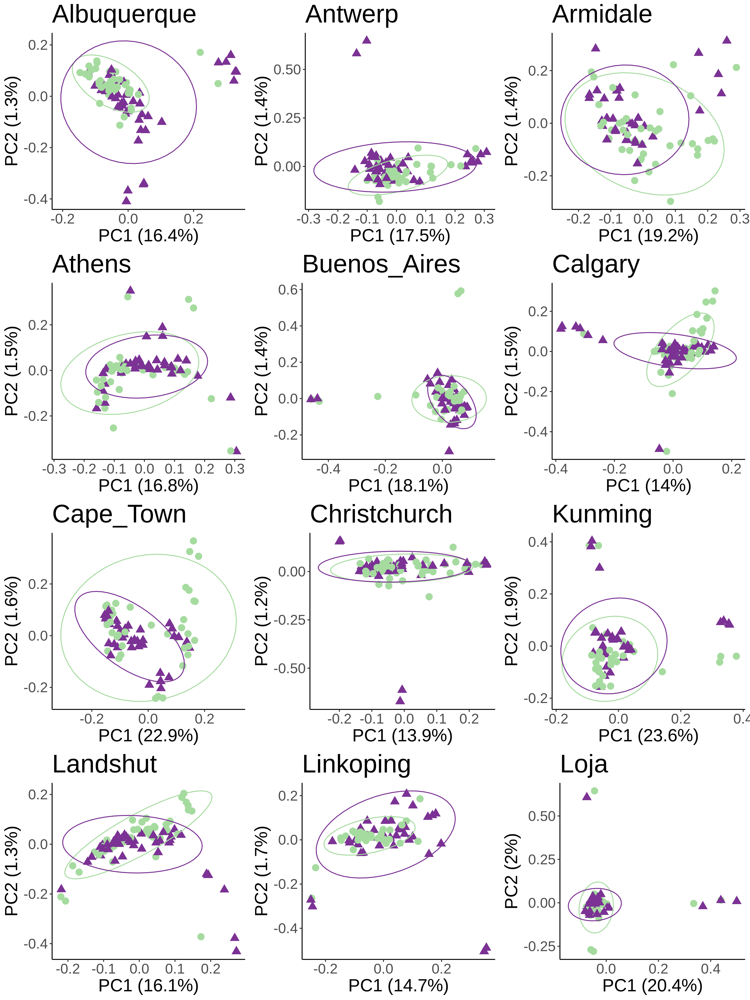

In [4]:
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/pca_pannel1.png")
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/pca_pannel2.png")


### Fst

<font color='red'>TO BE COMPLETED</font>

### Admixture

* Admixture proportions were estimated using NGSadmix with genotype likelihoods across all samples (minus related individuals) in each pair of urban-rural environement estimated in ANGSD
 - All K values from 2 to 10 were ran 10 times, each with a different random seed
 - Uses same 4fold SNPs as above
* I used Evanno's delta-K method implemented in CLUMPAK to estimate the upper-most level of structure (i.e., "optimal" K)

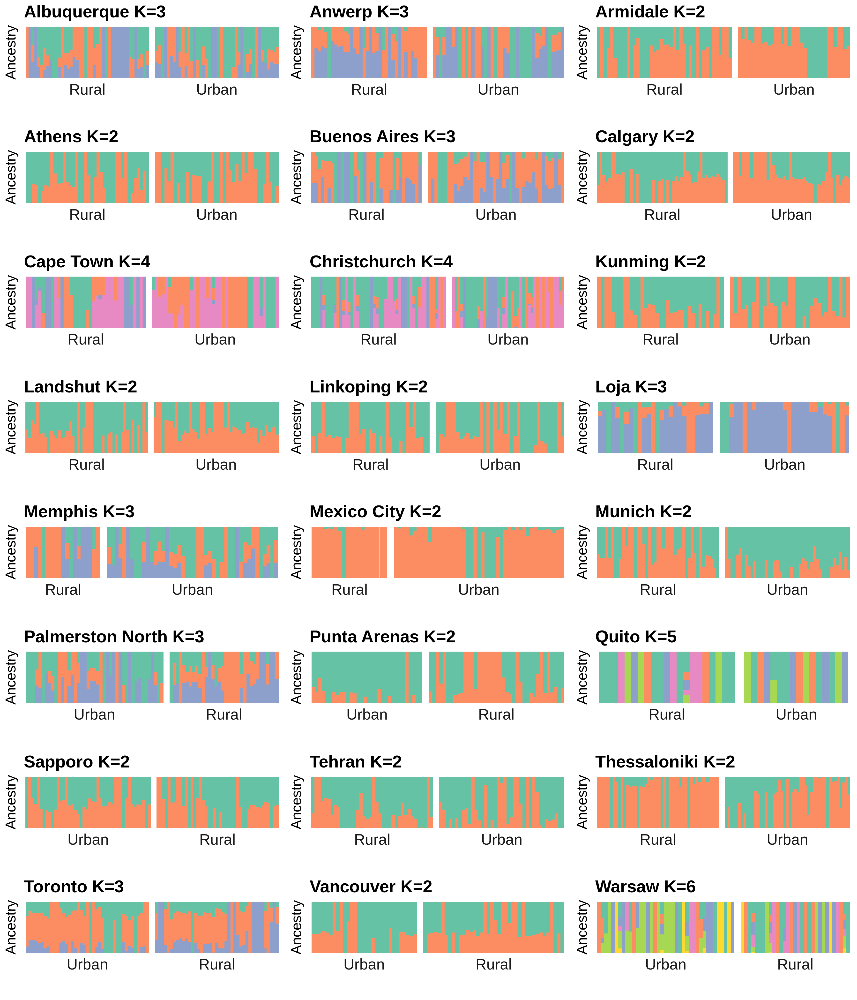

In [9]:
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/admixture/admixture_global.png")

* Global admixture proportion were also estimated for each city on the whole dataset following the same procedure.

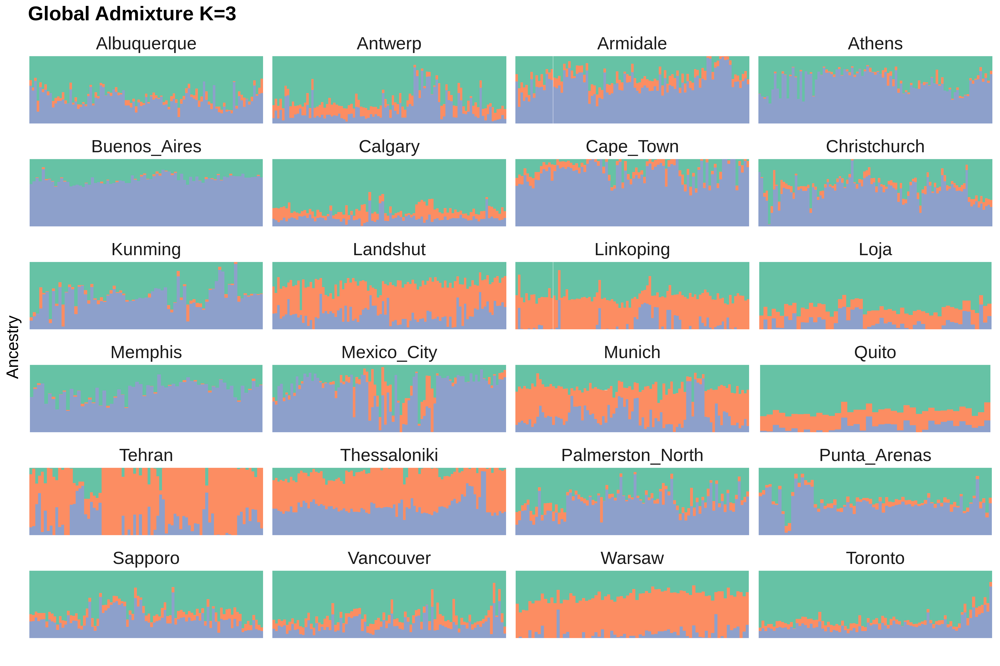

In [8]:
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/admixture/ADMIX_Global_city_K3.png")

## Diversity and population size

### Pi, Watterson's theta and Tajima's D

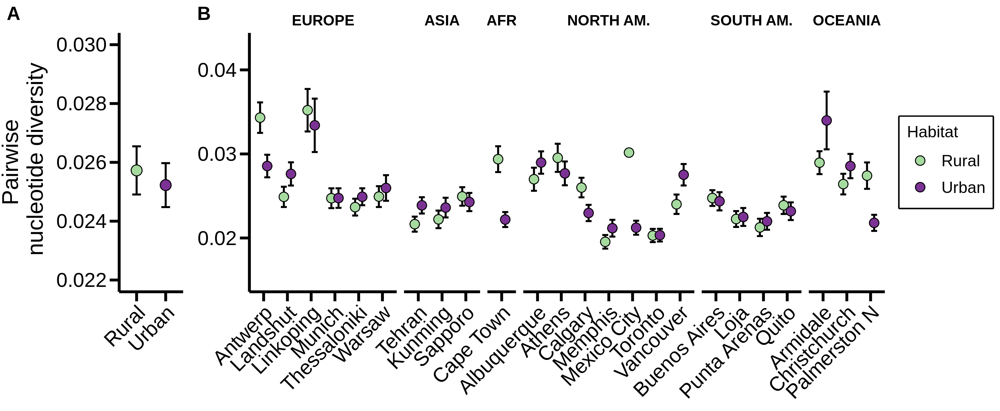

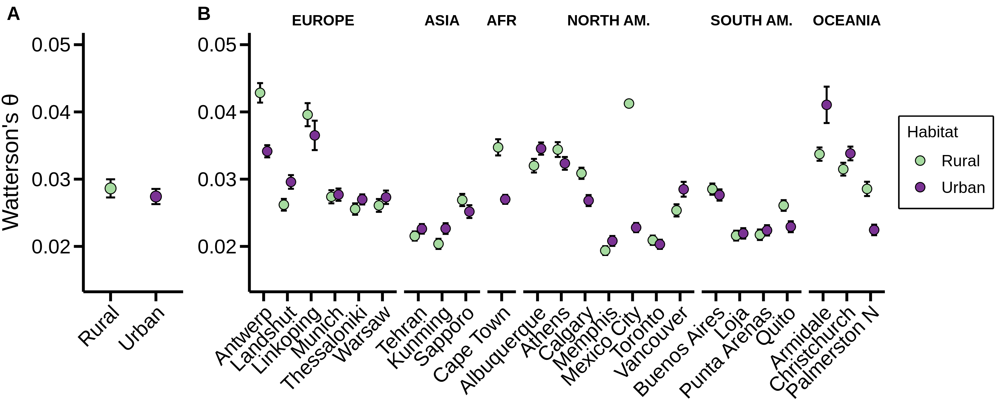

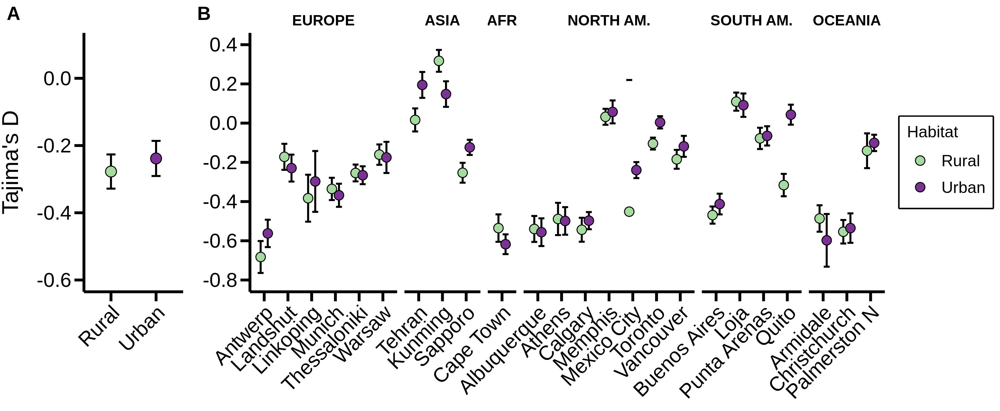

In [12]:
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pi_mean_plot.png")
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/theta_mean_plot.png")
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/tajima_mean_plot.png")


#### Do pi, theta and Dtaj vary between urban and urban habitat ?

Overall, we found no significant effect of the habitat (urban vs rural) on pi, theta and Tajima's D.


* pi

In [21]:
mod_pi1<-lmer(tp_mean~habitat+continent+range+habitat*continent+habitat*range +(1|continent/city),data=div_table,na.action = "na.fail")
#select_pi<-dredge(mod_pi1, trace=T, rank="AICc", REML=T)
select_pi
# Anova on the best model conta
best_mod_pi<-lmer(tp_mean~habitat +(1|city),data=div_table,na.action = "na.fail")
anova(best_mod_pi)

Warning message in checkConv(attr(opt, "derivs"), opt$par, ctrl = control$checkConv, :
“Model is nearly unidentifiable: large eigenvalue ratio
 - Rescale variables?”
Warning message in as_lmerModLT(model, devfun):
“Model may not have converged with 1 eigenvalue close to zero: -2.3e-20”


,(Intercept),continent,habitat,range,continent:habitat,habitat:range,df,logLik,AICc,delta,weight
,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<int>,<dbl>,<dbl>,<dbl>,<mdl.wght>
1,0.02543269,NA,NA,NA,NA,NA,4,199.1018,-389.2734,0.00000,9.973533e-01
5,0.02494712,NA,NA,+,NA,NA,5,194.1380,-376.8474,12.42606,1.997861e-03
3,0.02568265,NA,+,NA,NA,NA,5,193.0114,-374.5943,14.67915,6.476090e-04
7,0.02519708,NA,+,+,NA,NA,6,188.0476,-362.0464,27.22707,1.220577e-06
23,0.02529063,NA,+,+,NA,+,7,182.5894,-348.3788,40.89463,1.314298e-09
2,0.02578679,+,NA,NA,NA,NA,9,176.5717,-330.4065,58.86689,1.644620e-13
6,0.02578679,+,NA,+,NA,NA,10,171.9888,-318.0316,71.24183,3.379732e-16
4,0.02603675,+,+,NA,NA,NA,10,170.4813,-315.0166,74.25681,7.484946e-17
8,0.02603675,+,+,+,NA,NA,11,165.8984,-302.4634,86.81002,1.406992e-19


,Sum Sq,Mean Sq,NumDF,DenDF,F value,Pr(>F)
,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
habitat,2.999049e-06,2.999049e-06,1,23,0.5045661,0.4846414


* Watterson's theta

In [8]:
#finding the best model (with habitat variable) with AICc
mod_theta1<-lmer(tw_mean~habitat+continent+range+habitat*continent+habitat*range +(1|continent/city),data=div_table,na.action = "na.fail")
#select_theta<-dredge(mod_theta1, trace=T, rank="AICc", REML=T)
select_theta
# Anova on the best model
best_mod_theta<-lmer(tw_mean~habitat +(1|city),data=div_table,na.action = "na.fail")
anova(best_mod_theta)

Warning message in checkConv(attr(opt, "derivs"), opt$par, ctrl = control$checkConv, :
“Model is nearly unidentifiable: large eigenvalue ratio
 - Rescale variables?”
Warning message in as_lmerModLT(model, devfun):
“Model may not have converged with 1 eigenvalue close to zero: 1.9e-09”


,(Intercept),continent,habitat,range,continent:habitat,habitat:range,df,logLik,AICc,delta,weight
,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<int>,<dbl>,<dbl>,<dbl>,<mdl.wght>
1,0.02794305,NA,NA,NA,NA,NA,4,177.7653,-346.6003,0.00000,9.960423e-01
5,0.02761162,NA,NA,+,NA,NA,5,173.0262,-334.6239,11.97643,2.498213e-03
3,0.02854869,NA,+,NA,NA,NA,5,172.4864,-333.5442,13.05615,1.456031e-03
7,0.02821726,NA,+,+,NA,NA,6,167.7473,-321.4459,25.15445,3.436042e-06
23,0.02833869,NA,+,+,NA,+,7,162.6783,-308.5566,38.04367,5.460099e-09
2,0.03086562,+,NA,NA,NA,NA,9,157.8122,-292.8875,53.71276,2.161225e-12
6,0.03086562,+,NA,+,NA,NA,10,153.7056,-281.4653,65.13497,7.151540e-15
4,0.03147126,+,+,NA,NA,NA,10,152.5333,-279.1206,67.47968,2.214379e-15
8,0.03147126,+,+,+,NA,NA,11,148.4267,-267.5201,79.08017,6.702517e-18


,Sum Sq,Mean Sq,NumDF,DenDF,F value,Pr(>F)
,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
habitat,1.760631e-05,1.760631e-05,1,23,1.303166,0.2653821


* Tajima's D

In [10]:
#finding the best model (with habitat variable) with AICc
mod_taj1<-lmer(taj~habitat+continent+range+habitat*continent+habitat*range +(1|continent/city),data=div_table,na.action = "na.fail")
#select_taj<-dredge(mod_taj1, trace=T, rank="AICc", REML=T)
select_taj
# Anova on the best model
best_mod_taj<-lmer(taj~habitat +(1|city),data=div_table,na.action = "na.fail")
anova(best_mod_taj)

Warning message in as_lmerModLT(model, devfun):
“Model may not have converged with 1 eigenvalue close to zero: 5.4e-10”


,(Intercept),continent,habitat,range,continent:habitat,habitat:range,df,logLik,AICc,delta,weight
,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<int>,<dbl>,<dbl>,<dbl>,<mdl.wght>
1,-0.2573370,NA,NA,NA,NA,NA,4,16.087463,-23.2446940,0.000000,8.376954e-01
5,-0.2709210,NA,NA,+,NA,NA,5,15.188169,-18.9477656,4.296928,9.772821e-02
3,-0.2768079,NA,+,NA,NA,NA,5,14.652855,-17.8771391,5.367555,5.721849e-02
7,-0.2903918,NA,+,+,NA,NA,6,13.753561,-13.4583405,9.786353,6.280677e-03
2,-0.5764095,+,NA,NA,NA,NA,9,15.948136,-9.1594301,14.085264,7.319980e-04
23,-0.2905091,NA,+,+,NA,+,7,11.688103,-6.5762051,16.668489,2.011730e-04
6,-0.5764095,+,NA,+,NA,NA,10,15.605015,-5.2640832,17.980611,1.043869e-04
4,-0.5958805,+,+,NA,NA,NA,10,14.513528,-3.0811102,20.163584,3.504447e-05
8,-0.5958805,+,+,+,NA,NA,11,14.170407,0.9925202,24.237214,4.571323e-06


,Sum Sq,Mean Sq,NumDF,DenDF,F value,Pr(>F)
,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
habitat,0.01819778,0.01819778,1,23,2.935046,0.1001258


### Estimation of population size through time

Variation of population size was estimated for each city and habitat from the SFS using EPOS.
No significant difference of Ne was observed between urban and rural habitats in a majority of the city studied, and urban populations were found bigger than rural ones twice more than the oppsite. However, when compared in non-parametric and parametric analyses, we find no significant difference in population size between habitat (Wicoxon signed rank test : P=0.054; generalized linear model (negative binomial) Chi2 =1.181 P= 0.277).

Ne(rural)>Ne(urban) =3 times.

Ne(rural)<Ne(urban) =7 times.

Ne(rural)=Ne(urban) =14 times.

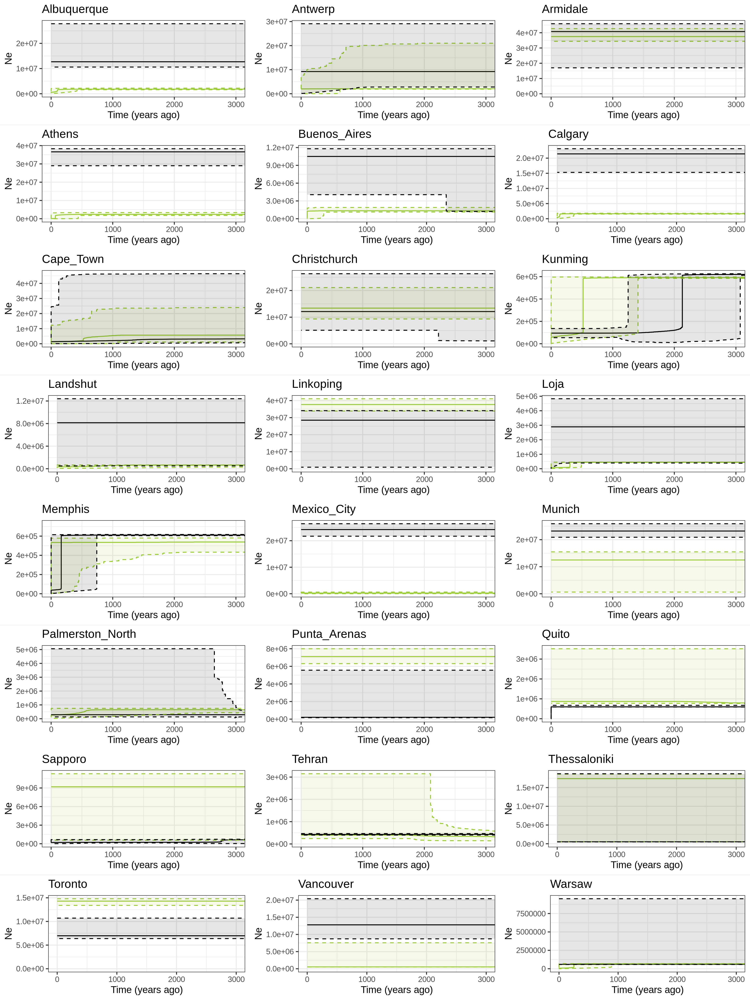

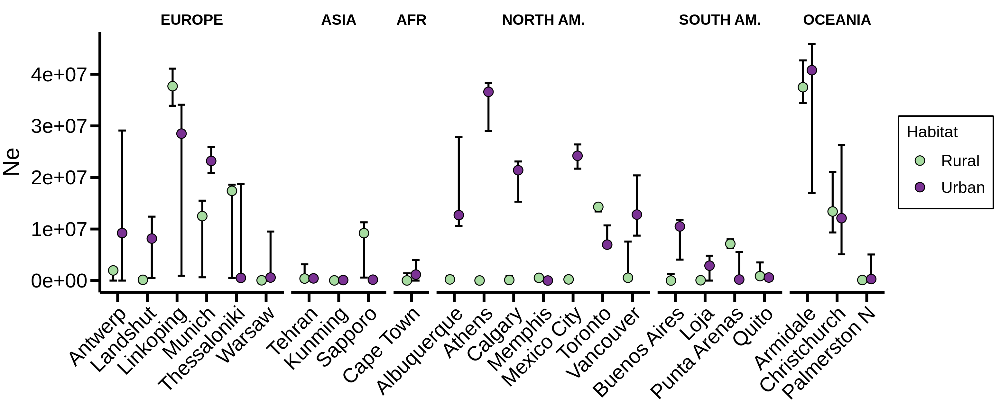

In [33]:
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/epos/epos_pannel.png")
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/ne_by_city_by_habitat.png")

#### Is current Ne different in urban and rural habitat ? <font color='red'>NO</font>

In [16]:
ne<-read.csv('ne_current_details.csv')
##Wilcoxon test
wilcox.test(Median ~ Habitat, data = ne, paired = TRUE,alternative = "less") 

## GLM  (best model selected via MuMIn on AIC)
best_model<-glmmTMB(Median~Habitat + (1|continent/City),family= nbinom2,data=ne,na.action = "na.fail")
glmmTMB:::Anova.glmmTMB(best_model)



	Wilcoxon signed rank exact test

data:  Median by Habitat
V = 93, p-value = 0.05369
alternative hypothesis: true location shift is less than 0


,Chisq,Df,Pr(>Chisq)
,<dbl>,<dbl>,<dbl>
Habitat,1.180874,1,0.2771782


#### Changes in population size in the last 500 years ? <font color='red'>NO</font>

In [19]:
observed_table <- matrix(c(20, 13, 4,11), nrow = 2, ncol = 2, byrow = T)
rownames(observed_table) <- c('stable', 'decreasing')
colnames(observed_table) <- c('urban', 'rural')
observed_table
X <- chisq.test(observed_table)
X

,urban,rural
stable,20,13
decreasing,4,11



	Pearson's Chi-squared test with Yates' continuity correction

data:  observed_table
X-squared = 3.4909, df = 1, p-value = 0.06171


### Demographic history reconstruction with dadi

[1] "Albuquerque"


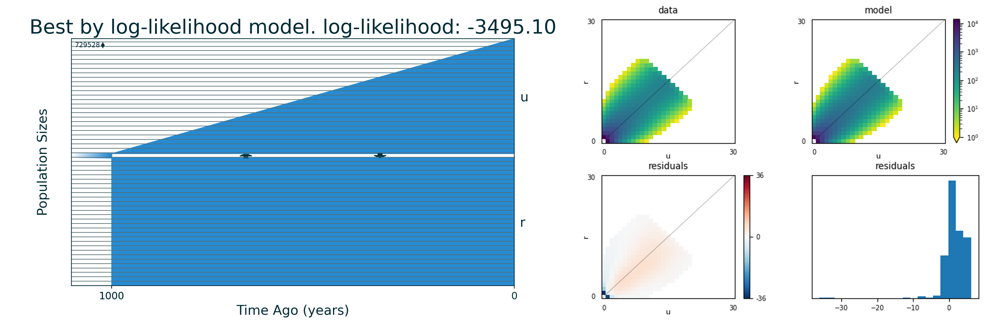

In [36]:
print('Albuquerque')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Albuquerque/output/best_logLL_model.png")


[1] "Antwerp"


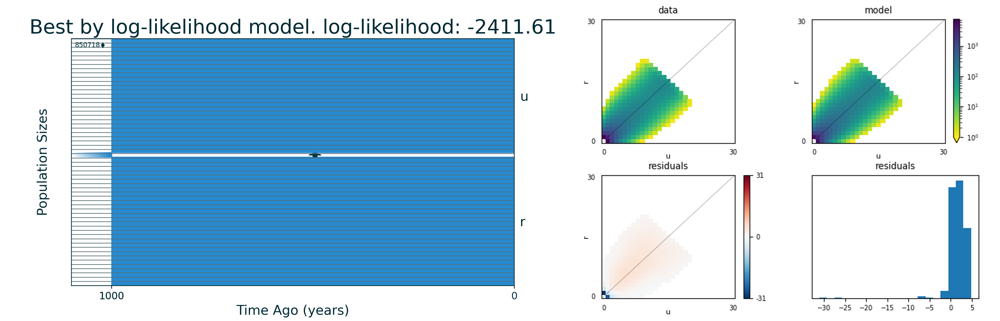

In [39]:
print('Antwerp')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Antwerp/output/best_logLL_model.png")


[1] "Armidale"


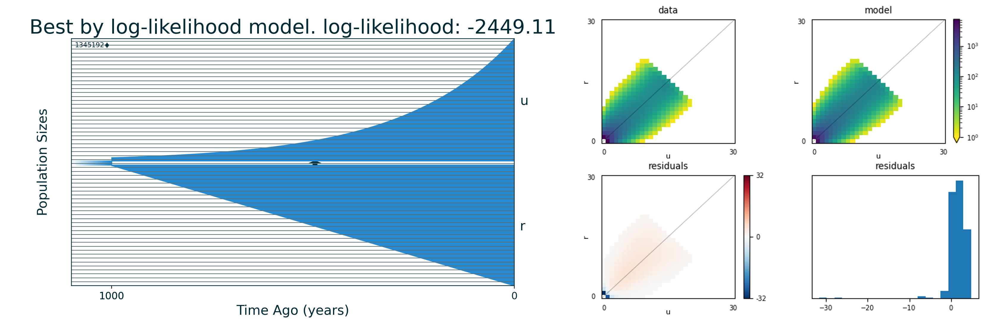

In [40]:
print('Armidale')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Armidale/output/best_logLL_model.png")


[1] "Athens"


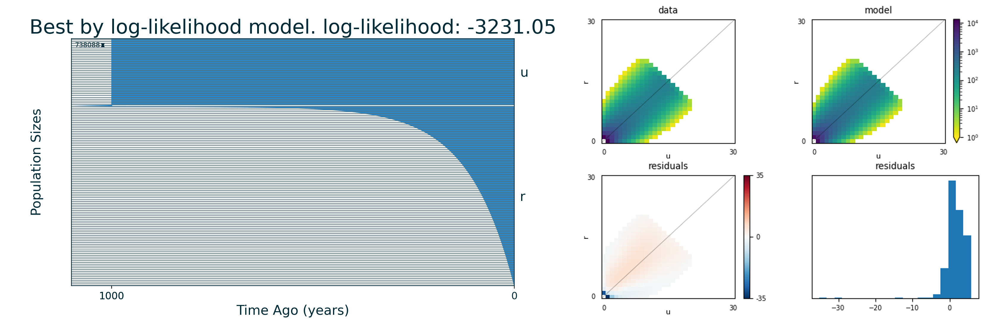

In [41]:
print('Athens')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Athens/output/best_logLL_model.png")


[1] "Buenos_Aires"


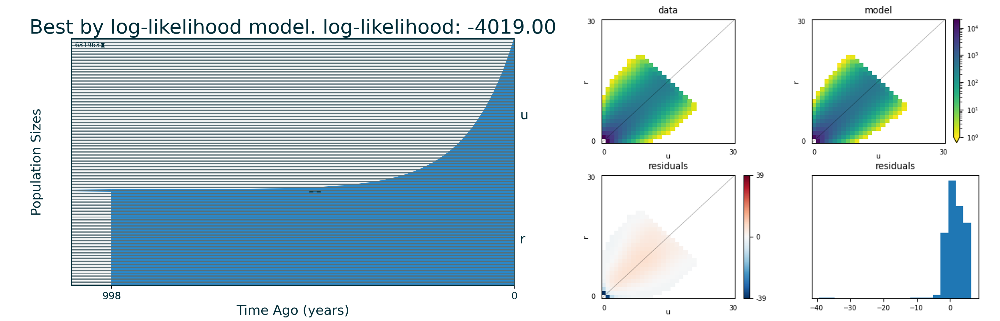

In [42]:
print('Buenos_Aires')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Buenos_Aires/output/best_logLL_model.png")


[1] "Calgary"


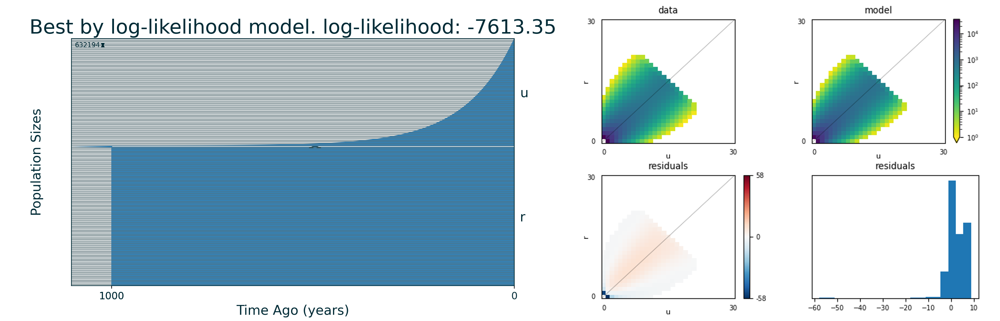

In [43]:
print('Calgary')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Calgary/output/best_logLL_model.png")


[1] "Cape_Town"


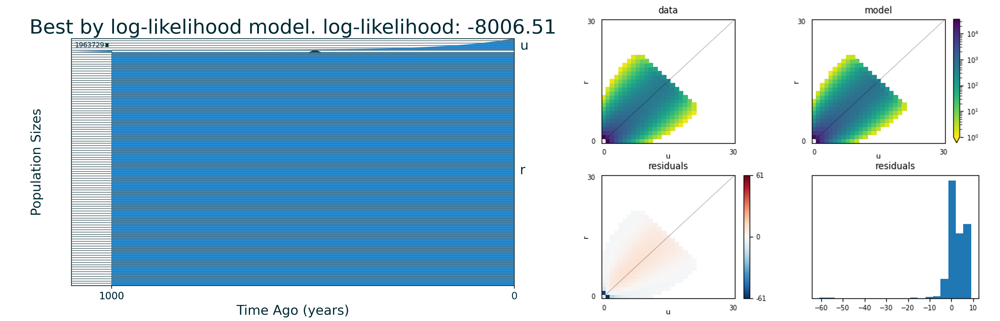

In [44]:
print('Cape_Town')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Cape_Town/output/best_logLL_model.png")


[1] "Christchurch"


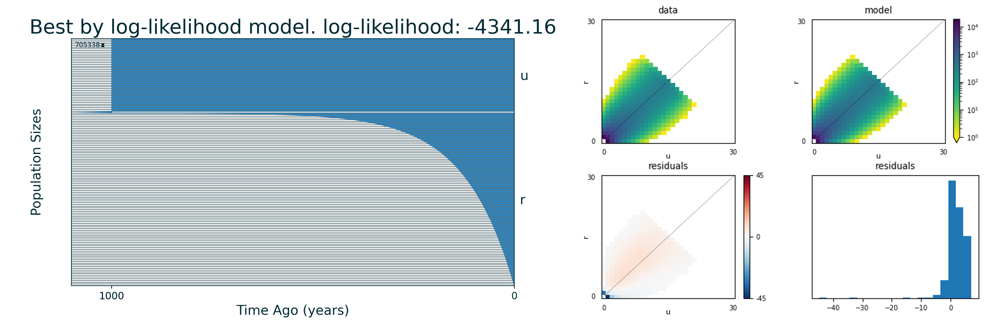

In [45]:
print('Christchurch')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Christchurch/output/best_logLL_model.png")


[1] "Kunming"


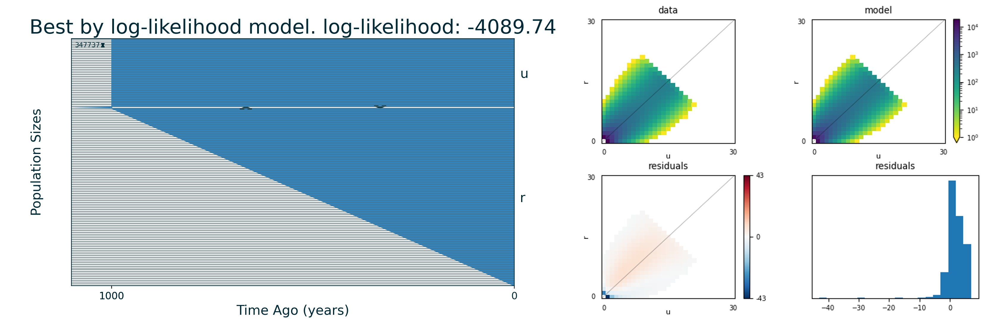

In [46]:
print('Kunming')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Kunming/output/best_logLL_model.png")


[1] "Landshut"


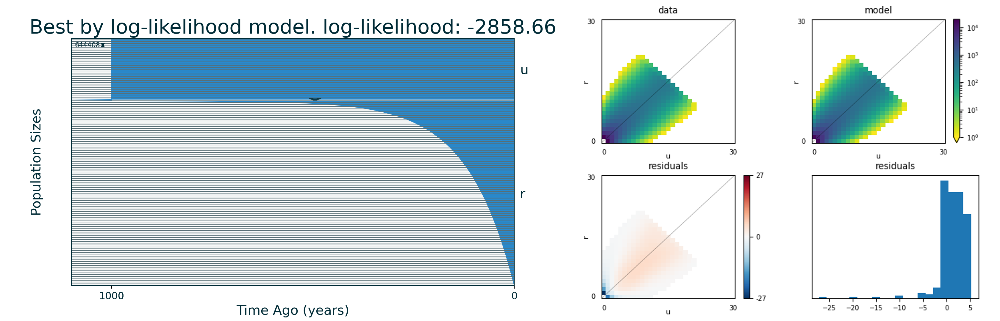

In [47]:
print('Landshut')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Landshut/output/best_logLL_model.png")


[1] "Linkoping"


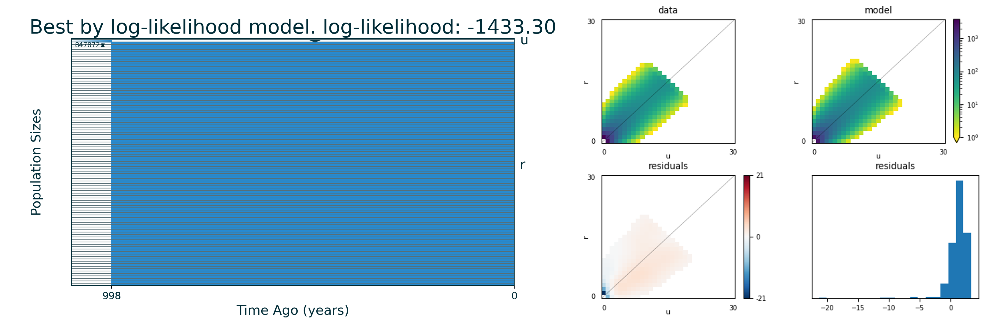

In [50]:
print('Linkoping')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Linkoping/output/best_logLL_model.png")


[1] "Loja"


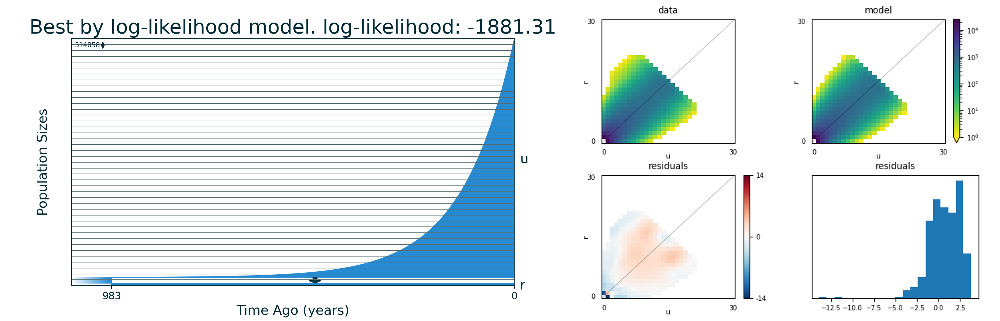

In [5]:
print('Loja')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Loja/output/best_logLL_model.png")


[1] "Memphis"


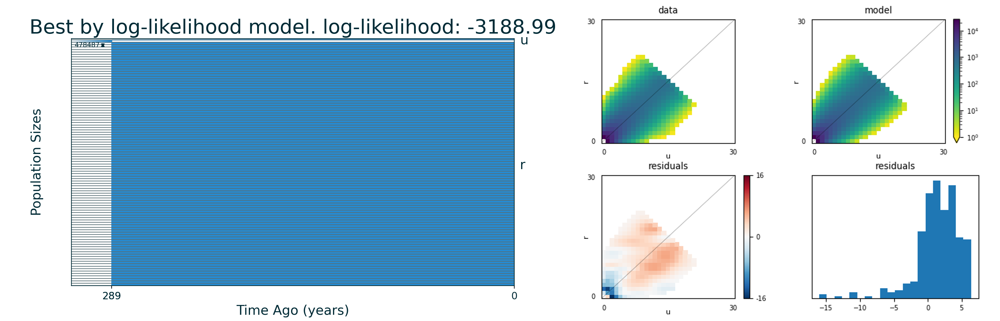

In [6]:
print('Memphis')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Memphis/output/best_logLL_model.png")


In [9]:
print('Mexico_City')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Mexico_city/output/best_logLL_model.png")


Warning message in file(con, "rb"):
“impossible d'ouvrir le fichier '/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Mexico_city/output/best_logLL_model.png' : Aucun fichier ou dossier de ce type”


ERROR: Error in file(con, "rb"): impossible d'ouvrir la connexion


[1] "Munich"


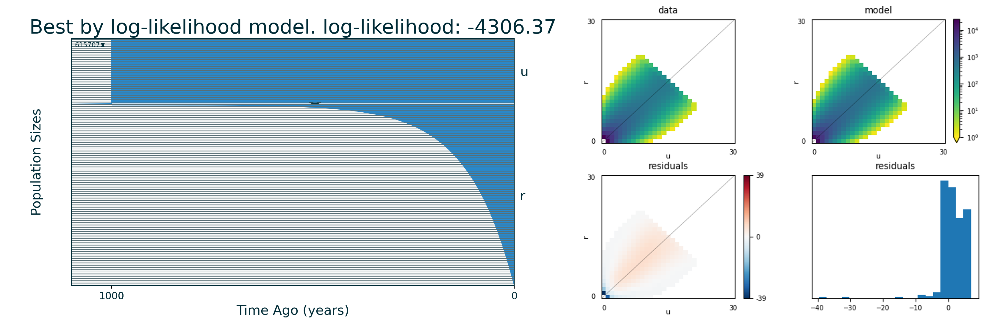

In [10]:
print('Munich')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Munich/output/best_logLL_model.png")


[1] "Palmerston_North"


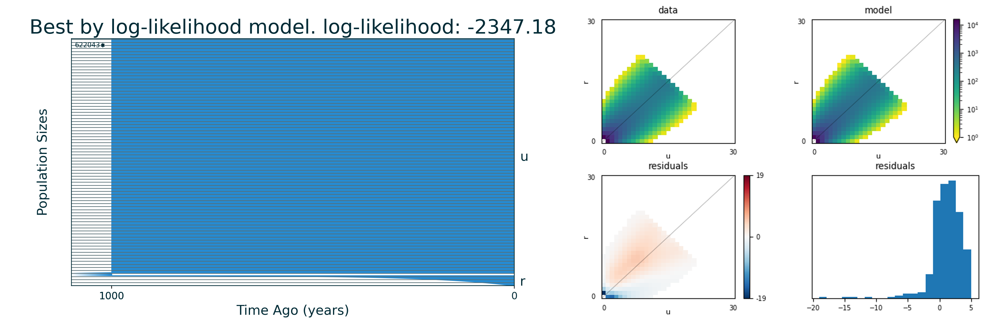

In [11]:
print('Palmerston_North')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Palmerston_North/output/best_logLL_model.png")


[1] "Punta_Arenas"


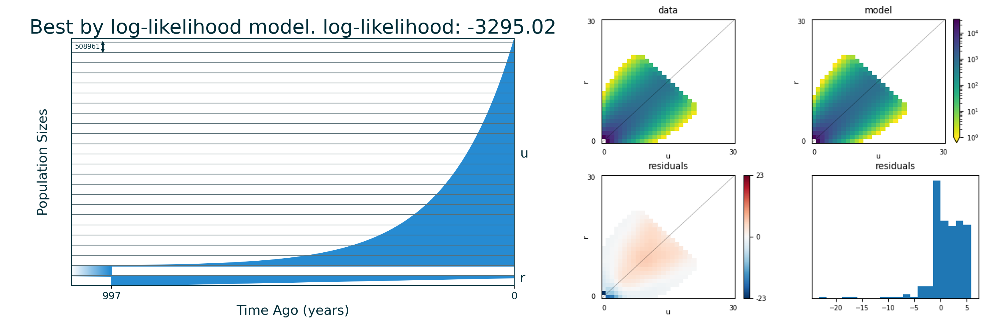

In [12]:
print('Punta_Arenas')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Punta_Arenas/output/best_logLL_model.png")


[1] "Quito"


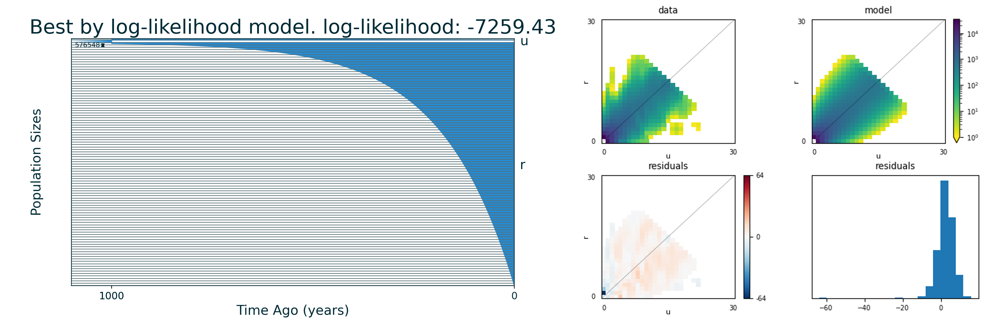

In [13]:
print('Quito')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Quito/output/best_logLL_model.png")


[1] "Sapporo"


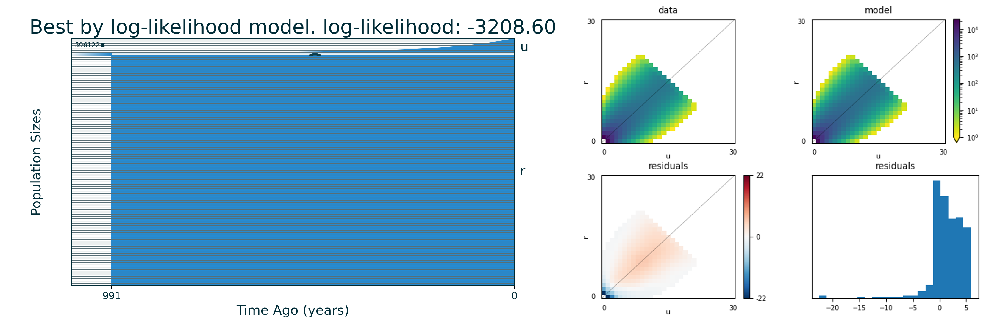

In [14]:
print('Sapporo')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Sapporo/output/best_logLL_model.png")


[1] "Thessaloniki"


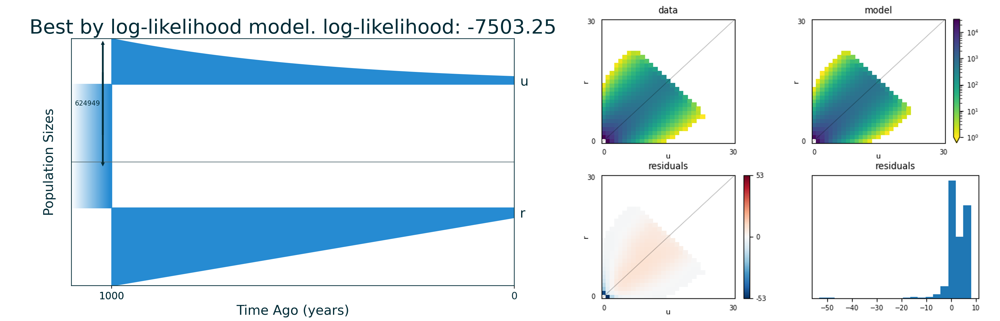

In [15]:
print('Thessaloniki')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Thessaloniki/output/best_logLL_model.png")


In [16]:
print('Toronto')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Toronto/output/best_logLL_model.png")


[1] "Toronto"


Warning message in file(con, "rb"):
“impossible d'ouvrir le fichier '/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Toronto/output/best_logLL_model.png' : Aucun fichier ou dossier de ce type”


ERROR: Error in file(con, "rb"): impossible d'ouvrir la connexion


[1] "Vancouver"


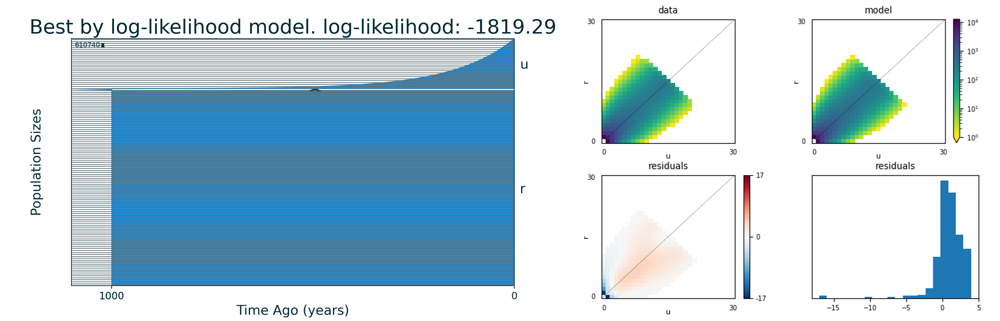

In [17]:
print('Vancouver')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Vancouver/output/best_logLL_model.png")


[1] "Warsaw"


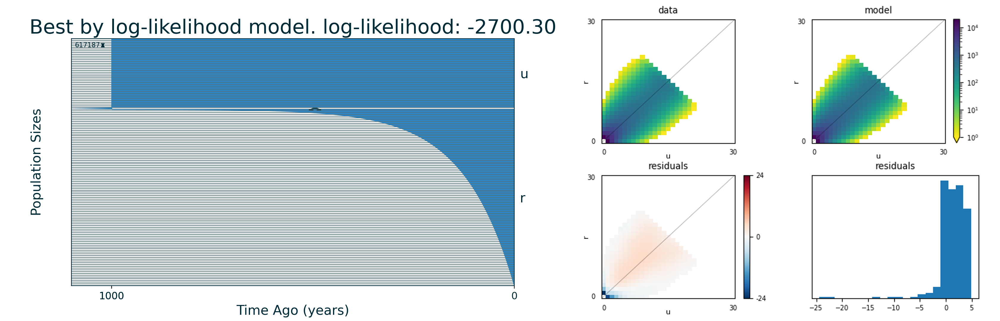

In [18]:
print('Warsaw')
display_png(file="/scratch/projects/trifolium/glue/demography/glue_demography/results/gadma/Warsaw/output/best_logLL_model.png")


# RUN FIRST

In [2]:
# Load required packages
library(ggplot2)
library(SIBER)
library(dplyr)
library(lme4)
library(readr)
library(glmmTMB)
library(MASS)
library(DHARMa)
library(emmeans)
library(stringr)
library(IRdisplay)
library(MuMIn)
library(lmerTest)

## Population structure files

In [3]:
# generating file with details
## loading sample sheet
obs_div_df <- suppressMessages(read_delim('../analyses/tables/div_popStruct/observed_urban-rural_pi.txt.bz2', delim = '\t'))  # Observed urban-rural thetas
obs_div_df<-subset(obs_div_df, city !='Bogota' & city !='Canberra' & city !='Hiroshima' & city!='Kyoto' & city!='Medellin' & city!='Melbourne' & city!='Paris')
sample_sheet<-read.csv("/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/resources/glue_noLowCities_sampleSheet_noRelated.txt", header=TRUE, sep="\t")
city_detail<-distinct(sample_sheet, city, .keep_all= TRUE)

## merging details per city to the diversity values
div_table<-merge(obs_div_df,city_detail, by.x="city", by.y="city", all.x=TRUE, all.y=FALSE)


## Ne files

In [4]:
# loading the file with all current population sizes
ne_tot<-read.table(paste0("/scratch/projects/trifolium/glue/demography/glue_demography/results/epos/epos/run/ne_current_data.txt"))
colnames(ne_tot)<-c("Time","LowerQ", "Median", "UpperQ","City","Habitat")
ne_tot$City<-gsub('Buenos', "Buenos_Aires", ne_tot$City)
ne_tot$City<-gsub('Cape', 'Cape_Town', ne_tot$City)
ne_tot$City<-gsub('Mexico', 'Mexico_City', ne_tot$City)
ne_tot$City<-gsub('Palmerston', 'Palmerston_North', ne_tot$City)
ne_tot$City<-gsub('Punta', 'Punta_Arenas', ne_tot$City)

# Merging with details in the sample_sheet
sample_sheet<-read.csv("/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/resources/glue_noLowCities_sampleSheet_noRelated.txt", header=TRUE, sep="\t")
city_detail<-distinct(sample_sheet, city, .keep_all= TRUE)
ne<-merge(ne_tot,city_detail, by.x="City", by.y="city", all.x=TRUE, all.y=FALSE)
#write_csv(ne, 'ne_current_details.csv')
